# NUP107 Transcriptomic Analysis

In [1]:
include(joinpath("..", "src", "project.jl"))

markdowntitle (generic function with 1 method)

# Expression of nup genes over development

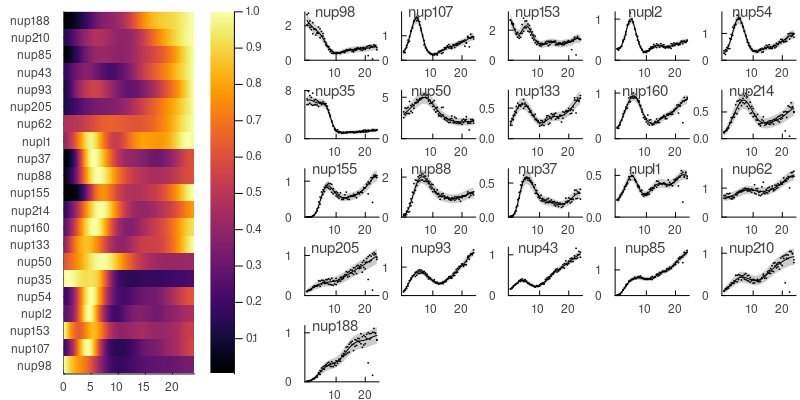

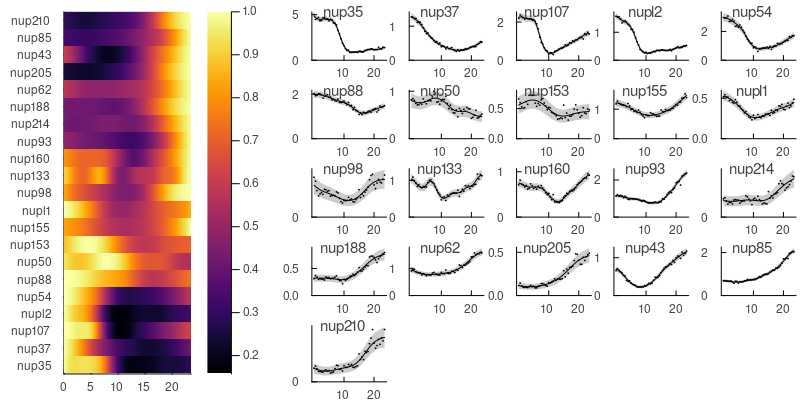

In [2]:
nups = loadnupgenes()
nupgeneplot(nups, "PA")
savedisplay("nup_gene_xep_pa.svg", dir="draft")
nupgeneplot(nups, "RZ")
savedisplay("nup_gene_xep_rz.svg", dir="draft");

In [3]:
gex_pa_rz = load_tpm_pa_rz();

Progress: 100%|█████████████████████████████████████████| Time: 0:00:00
Progress: 100%|█████████████████████████████████████████| Time: 0:00:00
Progress: 100%|█████████████████████████████████████████| Time: 0:00:00
Progress: 100%|█████████████████████████████████████████| Time: 0:00:00


Row,FIPA,FIRZ,count
,Bool,Bool,Int64
1,false,false,19345
2,false,true,419
3,true,false,603
4,true,true,13917


Row,FIPA,FIRZ,count
,Bool,Bool,Int64
1,false,false,19602
2,false,true,571
3,true,false,291
4,true,true,13820


In [4]:
writetpm(gex_pa_rz);

# QC plots, pairwise correlation and PCA

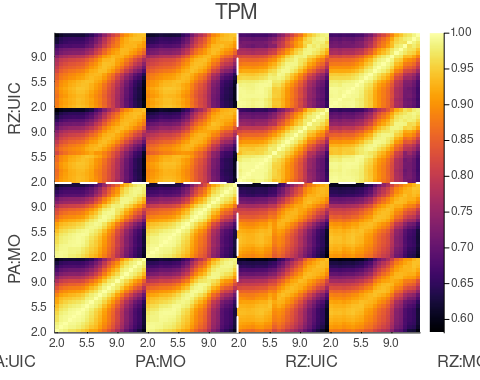

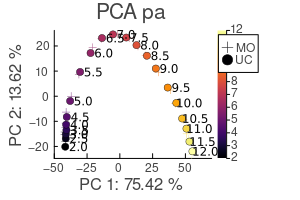

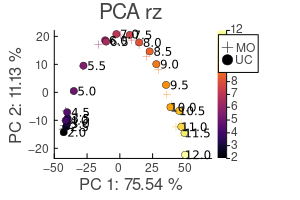

In [5]:
pc_tpm = pa_rz_cor_heatmap(gex_pa_rz, field=:tpm, dt=7,  title="TPM")
plot!(size=(480, 380))
savedisplay("corr_plot_parz.svg", dir="draft")

ppa = pcaplot(gex_pa_rz, parz="pa", xlims=(-50, 70))
plot!(size=(300, 200))
savedisplay("pca_pa.svg", dir="draft")
ppa = pcaplot(gex_pa_rz, parz="rz", dir=-1, xlims=(-50, 70))
plot!(size=(300, 200))
savedisplay("pca_rz.svg", dir="draft");

# Gaussian Process Regression

GP regression of PA and RZ time series. `@suppress_out` used as `GaussianProcesses.jl` prints to stdout when pos def exception is encountered during optimisation.

In [6]:
GP_PA = @suppress_out gp_genes_dt(gex_pa_rz.f_ind, gex_pa_rz.meta_pa, gex_pa_rz.tpm_pa; neldermead=true, threaded=true);
GP_RZ = @suppress_out gp_genes_dt(gex_pa_rz.f_ind, gex_pa_rz.meta_rz, gex_pa_rz.tpm_rz; neldermead=true, threaded=true);

GP: 100%|███████████████████████████████████████████████| Time: 0:00:40
GP: 100%|███████████████████████████████████████████████| Time: 0:00:46


In [7]:
gp_params_pa = paramtable(gex_pa_rz.gpgenes, GP_PA)
gp_params_rz = paramtable(gex_pa_rz.gpgenes, GP_RZ);


## build gp meta and tpm table for convenient plotting/clustering
pa_gp = gp_tpm_table(gex_pa_rz.tpm_pa, GP_PA, gex_pa_rz.filtind);
rz_gp = gp_tpm_table(gex_pa_rz.tpm_rz, GP_RZ, gex_pa_rz.filtind);
gpdata = Dict("pa" => (pa_gp.meta, pa_gp.tpm), "rz" => (rz_gp.meta, rz_gp.tpm)) ;

### PA/RZ tpm/gene
Diagnostic plot of lengthscales in full and individual models

---


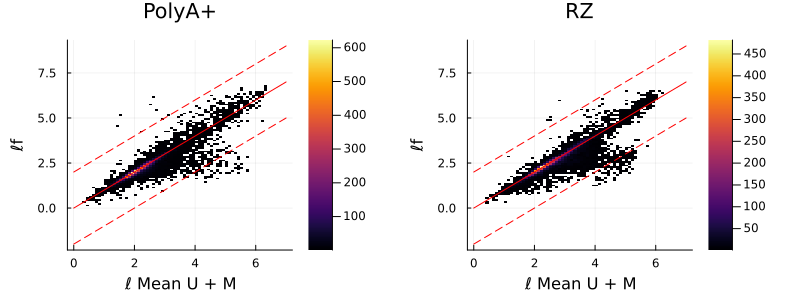

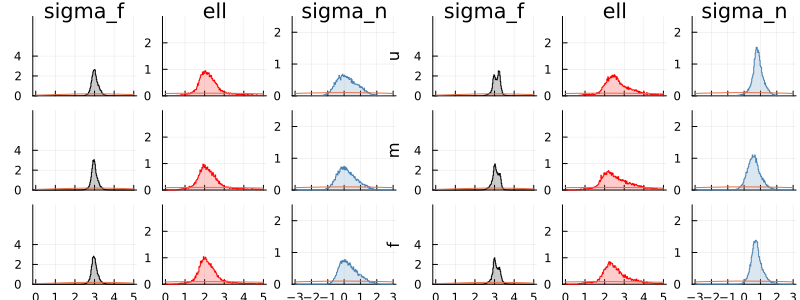

In [8]:
markdowntitle("PA/RZ tpm/gene\nDiagnostic plot of lengthscales in full and individual models")

p_ell_pa = @with gp_params_pa histogram2d(log.((:ℓ_u .+ :ℓ_m)./2), log.(:ℓ_f), bins=100, title="PolyA+")
p_ell_rz = @with gp_params_rz histogram2d(log.((:ℓ_u .+ :ℓ_m)./2), log.(:ℓ_f), bins=100, title="RZ")

map(p -> plot!(p, [0, 7], [0, 7], lab="", c=:red, xlabel="ℓ Mean U + M", ylabel="ℓf"), [p_ell_pa, p_ell_rz])
map(p -> plot!(p, [0, 7], [0, 7] .- 2, ls=:dash, lab="", c=:red), [p_ell_pa, p_ell_rz])
map(p -> plot!(p, [0, 7], [0, 7] .+ 2, ls=:dash, lab="", c=:red), [p_ell_pa, p_ell_rz])

    
plot(p_ell_pa, p_ell_rz, size=(800, 300), margin=5mm) |> display
plot(gp_param_hist(GP_PA), gp_param_hist(GP_RZ), size=(800, 300)) |> display

### PA/RZ Gene TPM

---


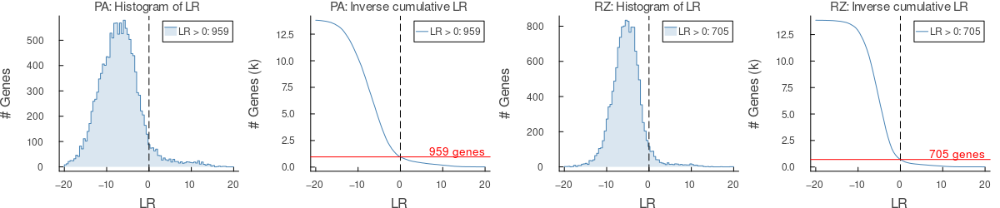

### PA/RZ Gene TPM

---


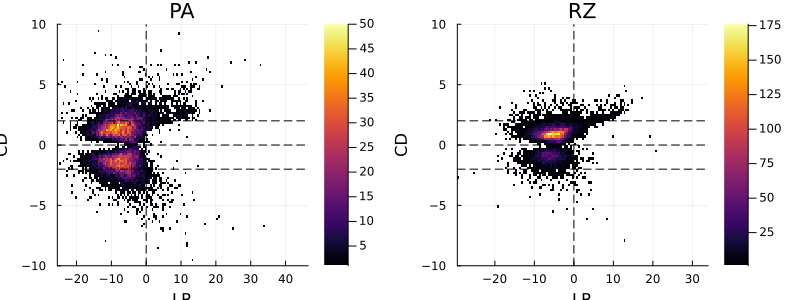

┌ Warning: Keyword argument `orientation` is deprecated.
│ Please use `permute` instead.
└ @ Plots ~/.julia/packages/Plots/7R93Y/src/args.jl:1552


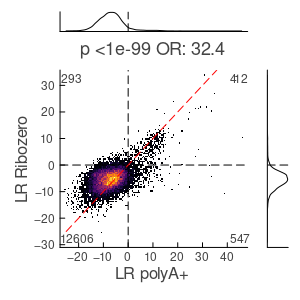

In [9]:
gp_de_all = parz_de_table(gex_pa_rz.gpgenes, GP_PA, GP_RZ);
markdowntitle("PA/RZ Gene TPM")
plot(plot_de_summary.(Ref(gp_de_all), ["PA", "RZ"])..., size=(1200, 250)) |> display
markdowntitle("PA/RZ Gene TPM"); 
lr_cd_histogram_parz(gp_de_all) |> display

parz_de_summary(gp_de_all)
plot!(size=(300, 300))
savedisplay("LR_parz.svg", dir="draft");

### Define differentially expresssed indicies

In [10]:
clinds = Dict{String, BitArray{1}}()
clinds["pa"]         = @with gp_de_all :PA_sig .& .!occursin.("ERCC-", :Gene);
clinds["rz"]         = @with gp_de_all :RZ_sig .& .!occursin.("ERCC-", :Gene);

ks = sort(collect(keys(clinds)))

cldf = DataFrame(K=ks, DataSet=first.(split.(ks, "_")), Condition=[join(split(k, "_")[2:end], "_") for k in ks], Count = [sum(clinds[k]) for k in ks])
unstack(cldf, :Condition, :DataSet, :Count)

Row,Condition,pa,rz
,String,Int64?,Int64?
1,,959,705


# K-means clustering of differentially expressed genes

Calculate silhouette to determine cluster number

### K means clustering silhouette scores for PA

---


Optimal maximum K between U and D: k = 3


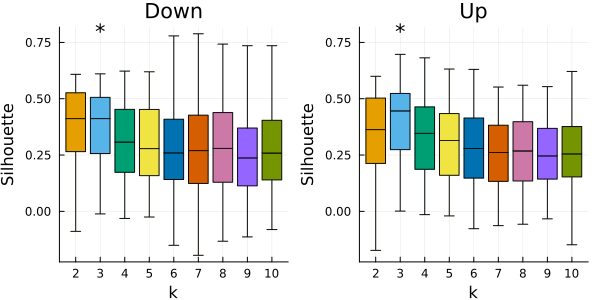

### K means clustering silhouette scores for RZ

---


Optimal maximum K between U and D: k = 3


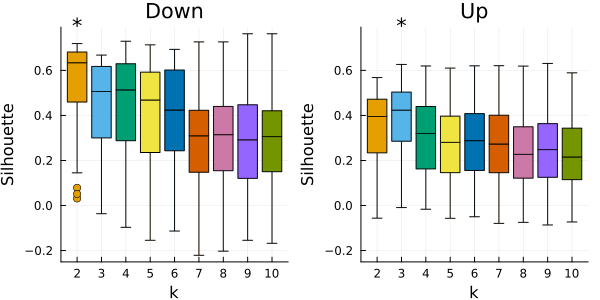

In [11]:
theme(:wong)
markdowntitle("K means clustering silhouette scores for PA")
kmeans_ud_silhouette(pa_gp.meta, pa_gp.tpm, clinds["pa"], seed=1618033) |> display
markdowntitle("K means clustering silhouette scores for RZ")
kmeans_ud_silhouette(pa_gp.meta, pa_gp.tpm, clinds["rz"], seed=1618033) |> display

theme(:wong2)

In [12]:
# clustering function that allows for multiple ks and sets of DE indicioes
ks = [3]
kls = ["pa", "rz"]
p = Progress(length(kls)*length(ks))
KMKD = Dict(string(kl, "_", k) => (next!(p); kmeans_ud(gpdata[first(split(kl, "_"))]..., clinds[kl], k, k, seed=1618033)) for kl in kls, k in ks);
finish!(p);

Calculate agreements between PA/RZ clusters and total up and down.

Row,PA_D_ind,PA_U_ind,PA_ClusterD,PA_ClusterU,PA_Cluster,count
,Bool,Bool,Int64,Int64,String,Int64
1,false,true,0,0,N,12958
2,false,true,0,2,U2,348
3,false,true,0,1,U1,288
4,true,false,2,0,D2,122
5,true,false,1,0,D1,84
6,false,true,0,3,U3,76
7,true,false,3,0,D3,41


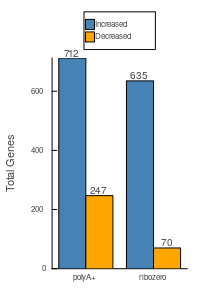

In [13]:
parz_clusters = join_cluster_tables(KMKD["pa_3"], KMKD["rz_3"])
@assert gp_de_all.Gene == parz_clusters.Gene
parz_clusters = [parz_clusters gp_de_all[!, r"(PA|RZ)_(LR|CD)"]]
combine(groupby(parz_clusters, names(parz_clusters, r"PA_Cluster|PA_[UD]_ind")), nrow => :count) |> display

pa_up = @with parz_clusters sum((:PA_Ind .& :PA_U_ind))
pa_dn = @with parz_clusters sum((:PA_Ind .& .!:PA_U_ind))
rz_up = @with parz_clusters sum((:RZ_Ind .& :RZ_U_ind))
rz_dn = @with parz_clusters sum((:RZ_Ind .& .!:RZ_U_ind))
groupedbar(["polyA+", "ribozero"], [pa_up pa_dn ; rz_up rz_dn], lab=["Increased" "Decreased"], c=[:steelblue :orange], ylabel="Total Genes")

annotate!((0.5-.2, pa_up, text(pa_up, font(:bottom, "helvetica", 10))))
annotate!((0.5+.2, pa_dn, text(pa_dn, font(:bottom, "helvetica", 10))))
annotate!((1.5-.2, rz_up, text(rz_up, font(:bottom, "helvetica", 10))))
annotate!((1.5+.2, rz_dn, text(rz_dn, font(:bottom, "helvetica", 10))))
plot!(size=(200, 300), grid=false, fontfamily="helvetica", leg=:outertop)
savedisplay("total_up_down.svg", dir="draft");

### Total Agreements in differentially expressed genes U/D between PA and RZ

---


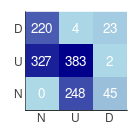

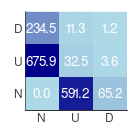

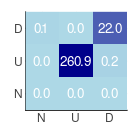

In [14]:
markdowntitle("Total Agreements in differentially expressed genes U/D between PA and RZ")

parz_clusters.PAC = first.(parz_clusters.PA_Cluster)
parz_clusters.RZC = first.(parz_clusters.RZ_Cluster)

parz_da = unstack(combine(groupby(parz_clusters, [:PAC, :RZC]), nrow => :count), :PAC, :RZC, :count)
M = Matrix(parz_da[!, 2:end])
E = sum(M, dims=2)*sum(M, dims=1)/sum(M)
P = abs.(-log10.(ccdf.(Poisson.(E), M)))
F = M./E
M[1, 1] = 0
E[1, 1] = 0
P[1, 1] = 0
pm = heatannot(names(parz_da)[2:end], parz_da.PAC, M, size=(140, 140), colorbar=false, c=:blues, fs=font("helvetica", 9, :white))
savedisplay("intersection_parz_counts.svg", dir="draft")
pe = heatannot(names(parz_da)[2:end], parz_da.PAC, E, size=(140, 140), colorbar=false, c=:blues, fs=font("helvetica", 9, :white))
savedisplay("intersection_parz_expected.svg", dir="draft")
pp = heatannot(names(parz_da)[2:end], parz_da.PAC, P, size=(140, 140), colorbar=false, trf=x -> log10(x .+ 1),  c=:blues, fs=font("helvetica", 9, :white))
savedisplay("intersection_parz_poisson.svg", dir="draft");

### Clusters pa_3

---


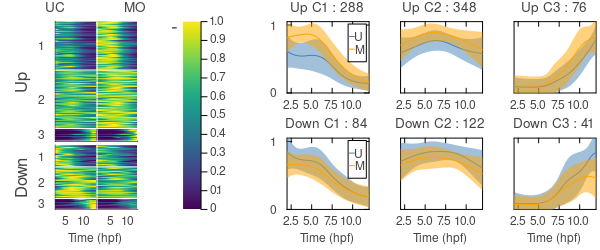

GKS: Rectangle definition is invalid in routine SET_VIEWPORT
GKS: Rectangle definition is invalid in routine SET_VIEWPORT
GKS: Rectangle definition is invalid in routine SET_VIEWPORT
GKS: Rectangle definition is invalid in routine SET_VIEWPORT
GKS: Rectangle definition is invalid in routine SET_VIEWPORT
GKS: Rectangle definition is invalid in routine SET_VIEWPORT
GKS: Rectangle definition is invalid in routine SET_VIEWPORT
GKS: Rectangle definition is invalid in routine SET_VIEWPORT


### Clusters rz_3

---


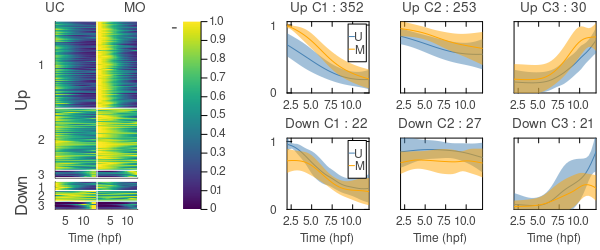

GKS: Rectangle definition is invalid in routine SET_VIEWPORT
GKS: Rectangle definition is invalid in routine SET_VIEWPORT
GKS: Rectangle definition is invalid in routine SET_VIEWPORT
GKS: Rectangle definition is invalid in routine SET_VIEWPORT
GKS: Rectangle definition is invalid in routine SET_VIEWPORT
GKS: Rectangle definition is invalid in routine SET_VIEWPORT
GKS: Rectangle definition is invalid in routine SET_VIEWPORT
GKS: Rectangle definition is invalid in routine SET_VIEWPORT


In [15]:
markdowntitle("Clusters pa_3")

plotclusterud_stack(KMKD["pa_3"])
plot!(size=(600, 250), left_margin=5mm)
savedisplay("full_clusters_pa_3.svg", dir="draft")

markdowntitle("Clusters rz_3")
plotclusterud_stack(KMKD["rz_3"], lta = @layout [a ; b{0.15h}])
plot!(size=(600, 250), left_margin=5mm)
savedisplay("full_clusters_rz_3.svg", dir="draft");


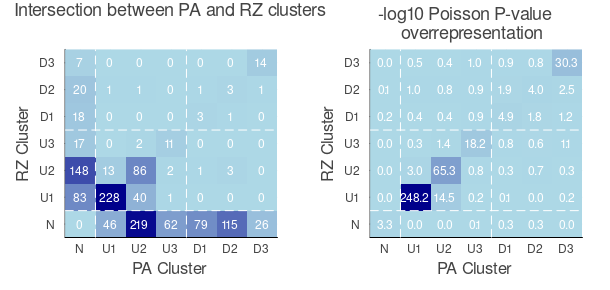

In [16]:
parz_clstats = @chain parz_clusters begin
    groupby([:PA_Cluster, :RZ_Cluster])
    combine(nrow => :count)
    unstack(:RZ_Cluster, :PA_Cluster, :count)
    coalesce.(0)
    sort(:RZ_Cluster, by = clusterorder)
    
end
parz_clstats = parz_clstats[!, ["RZ_Cluster" ; sort(names(parz_clstats)[2:end], by=clusterorder)]]
M = Matrix(parz_clstats[!, 2:end])
E = sum(M, dims=2)*sum(M, dims=1)/sum(M)
P = abs.(-log10.(ccdf.(Poisson.(E), M)))
F = M./E
M[1, 1] = 0
E[1, 1] = 0
F[1, 1] = 0
pc = heatannot(names(parz_clstats)[2:end], parz_clstats.RZ_Cluster, M, c=:blues, fs=font("helvetica", 8, :white)); annotate_parz_clusterplot!()
plot!(title="Intersection between PA and RZ clusters")
pp = heatannot(names(parz_clstats)[2:end], parz_clstats.RZ_Cluster, P, c=:blues, fs=font("helvetica", 8, :white)); annotate_parz_clusterplot!()
plot!(title="-log10 Poisson P-value\noverrepresentation")
plot(pc, pp, size=(610, 290), margin=5mm, fontfamily="helvetica", titlefont=font(12, "helvetica"), colorbar=false)
savedisplay("parz_cluster_intersect_v2.svg", dir="draft");

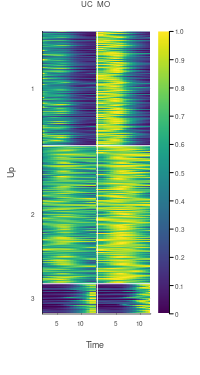

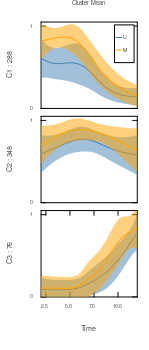

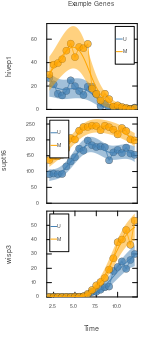

In [17]:

phu = viscluster_double(KMKD["pa_3"].meta.Time[KMKD["pa_3"].meta.Treat .== "UC"], KMKD["pa_3"].KMK_U, c=:viridis, colorbar=true, ylabel="Up", titlefont=font(10, "helvetica"), xlabel="Time", bottom_margin=3mm, title="UC  MO")
plot!(phu, size=(200, 375), fontfamily="helvetica") 
savedisplay("up_cluster_heatmap.svg", dir="draft")

p, phs = plotclustermeansd_vert(KMKD["pa_3"].KMK_U, KMKD["pa_3"].meta)    
plot!(phs[1], title="Cluster Mean", fontfamily="helvetica")
# plot!(phs[1], bottom_margin=-1mm, xticks=false)
[plot!(p, top_margin=-1mm, bottom_margin=-1mm,  xticks=false) for p in phs[1:end-1]]
plot!(phs[end], top_margin=-1mm, xlabel="Time")
plot!(phs[end],xlabel="Time", xticks=2.5:2.5:10)

pcs = plot(phs..., layout=(3, 1), size=(150, 350))
savedisplay("cluster_means.svg", dir="draft")


exgenes = ["hivep1", "supt16", "wisp3"]

ghs = [plotgpset(g, gex_pa_rz.gpgenes, GP_PA, showparams=false, samples=["U", "M"], fontfamily="helvetica", marker=(2, stroke(0))) for g in exgenes]
[plot!(p, top_margin=-1mm, bottom_margin=-1mm,  xticks=false) for p in ghs[1:end-1]]
plot!(ghs[end], top_margin=-1mm, xlabel="Time")
plot!(ghs[end],xlabel="Time")
[plot!(p, ylabel=g, title="") for (p, g) in zip(ghs, exgenes)]
plot!(ghs[1], title="Example Genes")
pgs = plot(ghs..., layout=(3, 1), size=(150, 350), framestyle=:box, grid=false)
savedisplay("example_genes.svg", dir="draft");


# Enrichments of mircroRNA seeds in UTRs

In [18]:
mirseqs, mirs   = loadmirs(organism=r"tropicalis");
utrs, gene_utrs = loadutrs(gex_tested=[gex_pa_rz]);
mir_iso_counts  = count_mir_threads(mirs.RCSeed, utrs.seq);
mir_gene_counts = collapse_isoscores(gene_utrs.Index, mir_iso_counts, collapse_fun=sum); # counts of mir seeds in utrs against utrs present in anntation file
mir_counts = mir_count_dict(gex_pa_rz, utrs, gene_utrs, mir_iso_counts, mir_gene_counts) # counts of mir seeds in utrs of genes quantified

miren_pa = @subset(innerjoin(mirs, mirenrich(KMKD["pa_3"].gtable.Cluster, mirs.MirIndex, mir_counts["pa"], 1), on=:MirIndex), :Cluster .!= "N")
miren_rz = @subset(innerjoin(mirs, mirenrich(KMKD["rz_3"].gtable.Cluster, mirs.MirIndex, mir_counts["rz"], 1), on=:MirIndex), :Cluster .!= "N");

### Motifs of interest
mois = load_motifs_of_interest()
mois_iso_counts = count_seq_threads(mois.Motif, LongDNA{4}.(utrs.seq));
mois_gene_counts = @time collapse_isoscores(gene_utrs.Index, mois_iso_counts, collapse_fun=sum);
mois_counts = mir_count_dict(gex_pa_rz, utrs, gene_utrs, mois_iso_counts, mois_gene_counts)

moten_pa = @subset(innerjoin(mois, mirenrich(KMKD["pa_3"].gtable.Cluster, mois.Index, mois_counts["pa"], 1), on=:Index => :MirIndex), :Cluster .!= "N")
moten_rz = @subset(innerjoin(mois, mirenrich(KMKD["rz_3"].gtable.Cluster, mois.Index, mois_counts["rz"], 1), on=:Index => :MirIndex), :Cluster .!= "N");

Counting mir seeds: 100%|███████████████████████████████| Time: 0:00:01
Progress: 100%|█████████████████████████████████████████| Time: 0:00:00


  0.000524 seconds (37.55 k allocations: 3.238 MiB)


### 3' UTR Motif enrichment

---


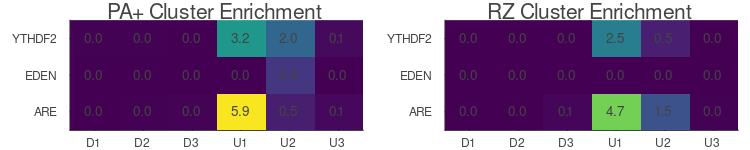

In [19]:
markdowntitle("3' UTR Motif enrichment")
plot(utr_motif_heatmap(moten_pa, clims=(0, 6), title="PA+ Cluster Enrichment"),
     utr_motif_heatmap(moten_rz, clims=(0, 6), title="RZ Cluster Enrichment"), layout=(1, 2), size=(750, 150), colorbar=false, fontfamily="helvetica")
savedisplay("utr_motif_enrichment.svg", dir="draft");

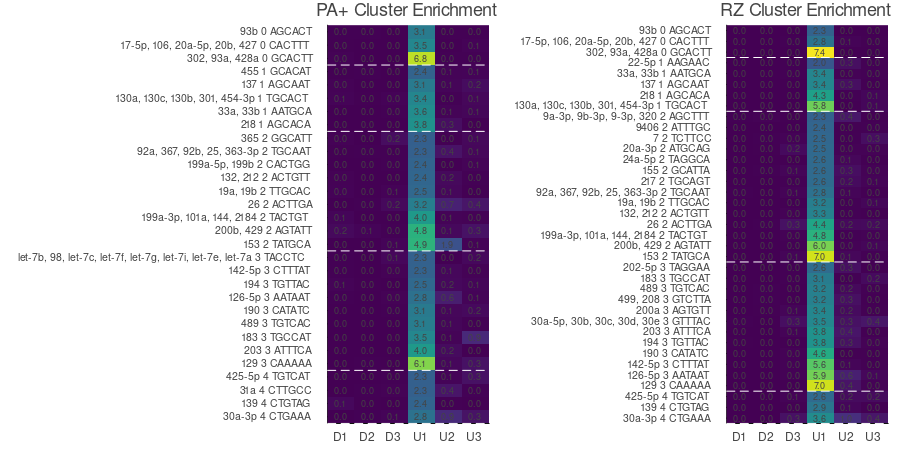

In [20]:
p_pa = mir_enrich_heatmap(miren_pa, title="PA+ Cluster Enrichment", fs=font("helvetica", 6))
p_rz = mir_enrich_heatmap(miren_rz, title="RZ Cluster Enrichment", fs=font("helvetica", 6))

plot(p_pa, p_rz, size=(900, 450), fontfamily="helvetica", colorbar=false, clims=(0, 7.5), ytickfont=font(7, "helvetica"), titlefont=font("helvetica", 12))
savedisplay("supp_mir_enrichment.svg", dir="draft");

In [21]:
markdowntitle("Do mir427 and ARE motifs occur in the same UTRs?")
mir427_ind = findfirst(mirs.RCSeed .== "GCACTT")
are_ind = findfirst(mois.ID .== "ARE")
selind = KMKD["pa_3"].gtable.Cluster .∈ Ref(["U1"])
# selind .= true
ht(mir_counts["pa"][selind, mir427_ind] .> 0, mois_counts["pa"][selind, are_ind] .> 0)

### Do mir427 and ARE motifs occur in the same UTRs?

---


(a = 118, b = 6, c = 119, d = 45, or = 7.436974789915967, logor_se = 0.45361528469024626, cil = 3.0568292743586385, ciu = 18.093452090957904, pvl = 0.9999999794664254, pvr = 1.6190510389542476e-7, pvb = 3.238102077908495e-7)

In [22]:
markdowntitle("Do mir427 and YTHDF2 motifs occur in the same UTRs?")
mir427_ind = findfirst(mirs.RCSeed .== "GCACTT")
yth_ind = findfirst(mois.ID .== "YTHDF2")
selind = KMKD["pa_3"].gtable.Cluster .∈ Ref(["U1"])
# selind .= true
ht(mir_counts["pa"][selind, mir427_ind] .> 0, mois_counts["pa"][selind, yth_ind] .> 0)

### Do mir427 and YTHDF2 motifs occur in the same UTRs?

---


(a = 123, b = 1, c = 142, d = 22, or = 19.056338028169016, logor_se = 1.0298674090757922, cil = 2.531620545085465, ciu = 143.4433054151017, pvl = 0.9999988403410491, pvr = 2.445083731757274e-5, pvb = 4.890167463514548e-5)

In [23]:
markdowntitle("Do ARE and YTHDF2 motifs occur in the same UTRs?")
selind = KMKD["pa_3"].gtable.Cluster .∈ Ref(["U1", "U2"])
# selind .= true
ht(mois_counts["pa"][selind, are_ind] .> 0, mois_counts["pa"][selind, yth_ind] .> 0)

### Do ARE and YTHDF2 motifs occur in the same UTRs?

---


(a = 482, b = 3, c = 96, d = 55, or = 92.04861111111111, logor_se = 0.603329517741755, cil = 28.213228519059427, ciu = 300.3182284424014, pvl = 1.0, pvr = 1.1269147559381187e-34, pvb = 2.2538295118762374e-34)

# TF Promoter Motif Enrichment

In [24]:
proms, gene_proms = loadpromoters();
motsel = loadmotifselection();

In [25]:
mot_sel_enrich = mot_score_thresh_enrich(motsel, proms, gene_proms, parz_clusters, minscore=5.0);

Scanning Motifs 100%|████████████████████████████████████| Time: 0:00:01
Progress: 100%|█████████████████████████████████████████| Time: 0:00:00


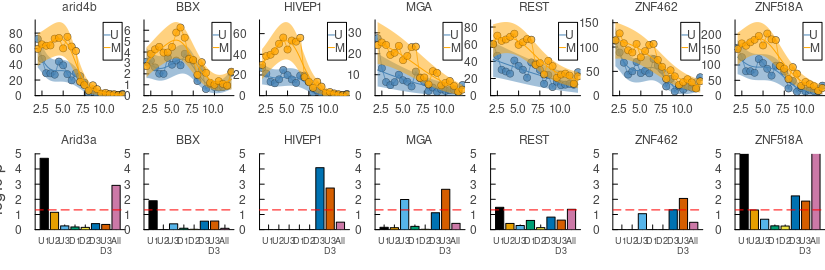

In [26]:
phs = Plots.Plot[]
for gdf in groupby(mot_sel_enrich, [:MotifName, :MotifID])
   # display(gdf)
    
    labels = join.(gdf.ClusterGroup, "\n")
    labels[end] = "All"
    p = bar(1:size(gdf, 1), -log10.(gdf.pvr), c=1:size(gdf, 1), xticks=(1:size(gdf, 1), labels), title=string.(gdf.MotifName[1]), lab="")
    hline!([-log10(0.05)], c=:red, ls=:dash, lab="")
    plot!(right_margin=-5mm, ylims=(0, 5), xtickfont=font(6, "helvetica"))
    push!(phs, p)
    
end

ghs = [plotgpset(Regex(string("\\|", lowercase(m), "\$")), gex_pa_rz.gpgenes, GP_PA) for m in replace.(getindex.(motsel, :name), "Arid3a" => "arid4b")]
[plot!(p, title=m) for (p,m) in zip(ghs, replace.(getindex.(motsel, :name), "Arid3a" => "arid4b"))]
plot!(ghs[1], ylabel="TPM")
plot!(phs[1], ylabel="-log10 p")
plot(ghs..., phs..., layout=(2, length(phs)), left_margin=-2mm, right_margin=-2mm, size=(1100*0.75, 360*0.75),  fontfamily="helvetica", titlefont=font(8, "helvetica"), bottom_margin=5mm, grid=false)
savedisplay("motif_enrichment.svg", dir="draft");

## Visualise mir-427 Reads

In [27]:
mir427_rz_pile = mir427_pile(gex_pa_rz, mqs=0, recalc=false);

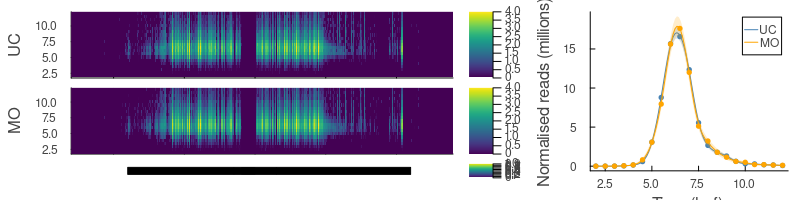

In [39]:
mir427_locus_figure(gex_pa_rz, mir427_rz_pile)
savedisplay("mir427_locus_figure.svg", dir="draft");

# Sequenced Fragment sizes
Demonstrate that mature microRNAs are not captured in the ribozero RNA-seq

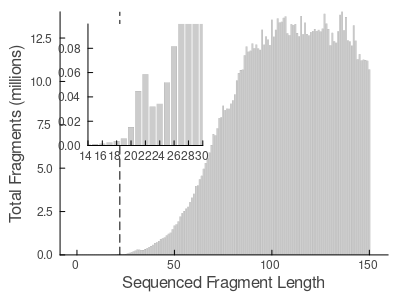

In [40]:
seq_frag_sizes_plot()
savedisplay("short_fragment_sizes.svg", dir="draft");

Identify short fragments containing mir427 mature micro RNA sequence.

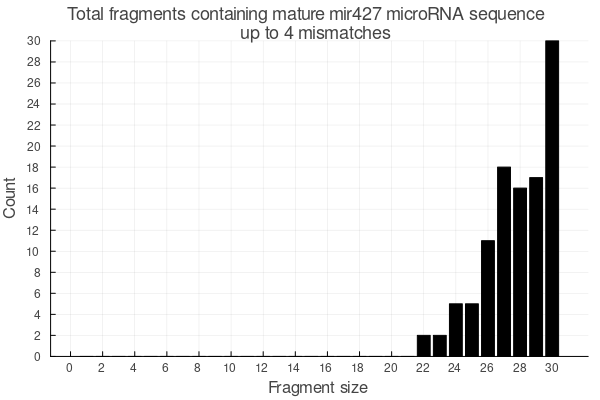

In [41]:
shortseqs = load_short_seq_library();
annotate_mir427_counts!(shortseqs, mm=4)
@with combine(groupby(shortseqs, :Length), :FC => sum => :FC, :RC => sum => :RC, :FA => sum => :FA, :RA => sum => :RA) bar(:Length, :RA)
xticks!(0:2:30)
yticks!(0:2:30)
plot!(xlabel="Fragment size", ylabel="Count", title="Total fragments containing mature mir427 microRNA sequence\nup to 4 mismatches", leg=false, fontfamily="helvetica", titlefont=font(12, "helvetica"))